##### Copyright 2020 The TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Convolutional Variational Autoencoder

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cvae">
    <img src="https://www.tensorflow.org/images/tf_logo_32px.png" />
    View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cvae.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This notebook demonstrates how to train a Variational Autoencoder (VAE) ([1](https://arxiv.org/abs/1312.6114), [2](https://arxiv.org/abs/1401.4082)) on the MNIST dataset. A VAE is a probabilistic take on the autoencoder, a model which takes high dimensional input data and compresses it into a smaller representation. Unlike a traditional autoencoder, which maps the input onto a latent vector, a VAE maps the input data into the parameters of a probability distribution, such as the mean and variance of a Gaussian. This approach produces a continuous, structured latent space, which is useful for image generation.

![CVAE image latent space](images/cvae_latent_space.jpg)

## Setup

In [ ]:
!pip install tensorflow-probability

# to generate gifs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-u4phvwtk
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-u4phvwtk
  Resolved https://github.com/tensorflow/docs to commit de223126b8f1c5365f935e687b56518cf256b4b6
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2025.3.6.10029-py3-none-any.whl size=186351 sha256=06719fc234a314849d2848e92f2d53a3915d2e4fc0da0955199860452b60fd1f
  Stored in directory: /tmp/pip-ephem-wheel-cache-v0q_bypx/wheels/34/53/89/3db54cf97ce0f0261aaab3fdc12a847ea0879d34edf373e2c5
Successfully built tensorflow-docs


In [ ]:
from IPython import display

import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time

## Load the fashion dataset


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

# Parameters
data_path = "/content/drive/MyDrive/Colab Notebooks/tfg/fashion_images/fashion_images_converted/"
IMG_SIZE = 64
BATCH_SIZE = 128
VAL_SPLIT = 0.2
SEED = 42

# Load training dataset (no labels)
train_dataset = tf.keras.utils.image_dataset_from_directory(
    data_path,
    label_mode=None,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
    validation_split=VAL_SPLIT,
    subset="training"
)

# Load validation dataset
val_dataset = tf.keras.utils.image_dataset_from_directory(
    data_path,
    label_mode=None,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
    validation_split=VAL_SPLIT,
    subset="validation"
)

# Define data augmentation pipeline
data_augmentation = tf.keras.Sequential([
    layers.Resizing(IMG_SIZE, IMG_SIZE),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.0417),  # ~15 degrees
    layers.RandomTranslation(0.05, 0.05),
    layers.RandomContrast(0.2),
    layers.Lambda(lambda x: tf.image.random_brightness(x, max_delta=0.2)),
    layers.Lambda(lambda x: tf.image.random_saturation(x, lower=0.8, upper=1.2)),
    layers.Rescaling(1./127.5, offset=-1),  # Normalize to [-1, 1]
])

# For test set: only resize and normalize
preprocess = tf.keras.Sequential([
    layers.Resizing(IMG_SIZE, IMG_SIZE),
    layers.Rescaling(1./127.5, offset=-1),
])

# Apply transformations
train_dataset = train_dataset.map(lambda x: data_augmentation(x)).cache().shuffle(1000).prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.map(lambda x: preprocess(x)).cache().prefetch(tf.data.AUTOTUNE)


Found 1843 files.
Using 1475 files for training.
Found 1843 files.
Using 368 files for validation.


## Define the encoder and decoder networks with *tf.keras.Sequential*

In this VAE example, use two small ConvNets for the encoder and decoder networks. In the literature, these networks are also referred to as inference/recognition and generative models respectively. Use `tf.keras.Sequential` to simplify implementation. Let $x$ and $z$ denote the observation and latent variable respectively in the following descriptions.

### Encoder network
This defines the approximate posterior distribution $q(z|x)$, which takes as input an observation and outputs a set of parameters for specifying the conditional distribution of the latent representation $z$.
In this example, simply model the distribution as a diagonal Gaussian, and the network outputs the mean and log-variance parameters of a factorized Gaussian.
Output log-variance instead of the variance directly for numerical stability.

### Decoder network
This defines the conditional distribution of the observation $p(x|z)$, which takes a latent sample $z$ as input and outputs the parameters for a conditional distribution of the observation.
Model the latent distribution prior $p(z)$ as a unit Gaussian.

### Reparameterization trick
To generate a sample $z$ for the decoder during training, you can sample from the latent distribution defined by the parameters outputted by the encoder, given an input observation $x$.
However, this sampling operation creates a bottleneck because backpropagation cannot flow through a random node.

To address this, use a reparameterization trick.
In our example, you approximate $z$ using the decoder parameters and another parameter $\epsilon$ as follows:

$$z = \mu + \sigma \odot \epsilon$$

where $\mu$ and $\sigma$ represent the mean and standard deviation of a Gaussian distribution respectively. They can be derived from the decoder output. The $\epsilon$ can be thought of as a random noise used to maintain stochasticity of $z$. Generate $\epsilon$ from a standard normal distribution.

The latent variable $z$ is now generated by a function of $\mu$, $\sigma$ and $\epsilon$, which would enable the model to backpropagate gradients in the encoder through $\mu$ and $\sigma$ respectively, while maintaining stochasticity through $\epsilon$.

### Network architecture
For the encoder network, use two convolutional layers followed by a fully-connected layer. In the decoder network, mirror this architecture by using a fully-connected layer followed by three convolution transpose layers (a.k.a. deconvolutional layers in some contexts). Note, it's common practice to avoid using batch normalization when training VAEs, since the additional stochasticity due to using mini-batches may aggravate instability on top of the stochasticity from sampling.


In [ ]:
class CVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(IMG_SIZE, IMG_SIZE, 3)),
            tf.keras.layers.Conv2D(
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            # No activation
            tf.keras.layers.Dense(latent_dim + latent_dim),
        ]
    )

    self.decoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(units=8*8*32, activation=tf.nn.relu), # Adjusted units to match potential output size
            tf.keras.layers.Reshape(target_shape=(8, 8, 32)), # Adjusted reshape target
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=3, kernel_size=3, strides=2, padding='same', activation='sigmoid'), # Added another Conv2DTranspose and sigmoid activation for final output
        ]
    )

  @tf.function
  def sample(self, eps=None):
    if eps is None:
      eps = tf.random.normal(shape=(100, self.latent_dim))
    return self.decode(eps, apply_sigmoid=True)

  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    eps = tf.random.normal(shape=mean.shape)
    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      # The last layer of the decoder now directly outputs probabilities with sigmoid
      return logits
    return logits # Still return logits if apply_sigmoid is False

## Define the loss function and the optimizer

VAEs train by maximizing the evidence lower bound (ELBO) on the marginal log-likelihood:

$$\log p(x) \ge \text{ELBO} = \mathbb{E}_{q(z|x)}\left[\log \frac{p(x, z)}{q(z|x)}\right].$$

In practice, optimize the single sample Monte Carlo estimate of this expectation:

$$\log p(x| z) + \log p(z) - \log q(z|x),$$
where $z$ is sampled from $q(z|x)$.

Note: You could also analytically compute the KL term, but here you incorporate all three terms in the Monte Carlo estimator for simplicity.

In [ ]:
optimizer = tf.keras.optimizers.Adam(1e-4)


def log_normal_pdf(sample, mean, logvar, raxis=1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(
      -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
      axis=raxis)


def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)
  cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
  logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
  logpz = log_normal_pdf(z, 0., 0.)
  logqz_x = log_normal_pdf(z, mean, logvar)
  return -tf.reduce_mean(logpx_z + logpz - logqz_x)


@tf.function
def train_step(model, x, optimizer):
  """Executes one training step and returns the loss.

  This function computes the loss and gradients, and uses the latter to
  update the model's parameters.
  """
  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

## Training

* Start by iterating over the dataset
* During each iteration, pass the image to the encoder to obtain a set of mean and log-variance parameters of the approximate posterior $q(z|x)$
* then apply the *reparameterization trick* to sample from $q(z|x)$
* Finally, pass the reparameterized samples to the decoder to obtain the logits of the generative distribution $p(x|z)$
* Note: Since you use the dataset loaded by keras with 60k datapoints in the training set and 10k datapoints in the test set, our resulting ELBO on the test set is slightly higher than reported results in the literature which uses dynamic binarization of Larochelle's MNIST.

### Generating images

* After training, it is time to generate some images
* Start by sampling a set of latent vectors from the unit Gaussian prior distribution $p(z)$
* The generator will then convert the latent sample $z$ to logits of the observation, giving a distribution $p(x|z)$
* Here, plot the probabilities of Bernoulli distributions


In [ ]:
epochs = 100
# set the dimensionality of the latent space to a plane for visualization later
latent_dim = 2
num_examples_to_generate = 16

# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(
    shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
def generate_and_save_images(model, epoch, test_sample):
  mean, logvar = model.encode(test_sample)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)

        image = predictions[i]
        image = image.numpy()  # Asegúrate de que sea un array de NumPy si es tensor

        # print(f"Image max value: {np.max(image)}")
        # print(f"Image min value: {np.min(image)}")
        if image.shape[-1] == 1:  # escala de grises
            plt.imshow(image[:, :, 0], cmap='gray')
        else:  # RGB
            plt.imshow(image)  # matplotlib acepta RGB en [0,1]

        plt.axis('off')

  plt.tight_layout()
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
# Set how many samples you want to generate from test data
num_examples_to_generate = 16  # for example
batch_size = BATCH_SIZE        # must match your dataset's BATCH_SIZE

assert batch_size >= num_examples_to_generate

# Pick a batch from test set
for test_batch in val_dataset.take(1):  # 'val_dataset' is your test set
    test_sample = test_batch[:num_examples_to_generate]  # shape: (num_examples, 64, 64, 3)


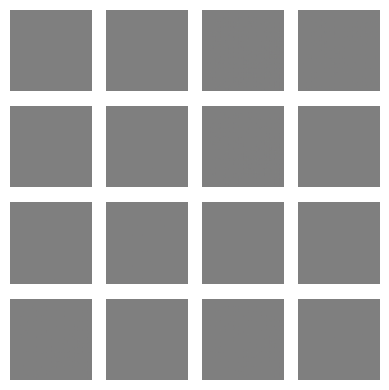

Epoch: 1, Test set ELBO: -8713.947265625, time elapse for current epoch: 19.345637798309326


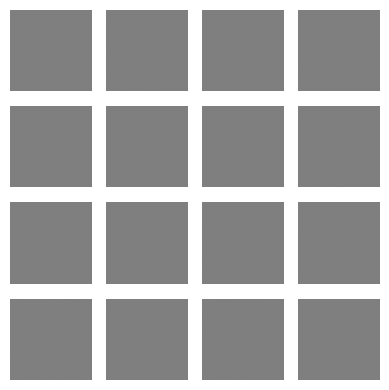

Epoch: 2, Test set ELBO: -8711.3515625, time elapse for current epoch: 4.603636741638184


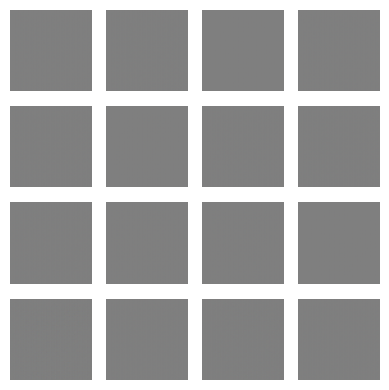

Epoch: 3, Test set ELBO: -8706.37109375, time elapse for current epoch: 3.8224668502807617


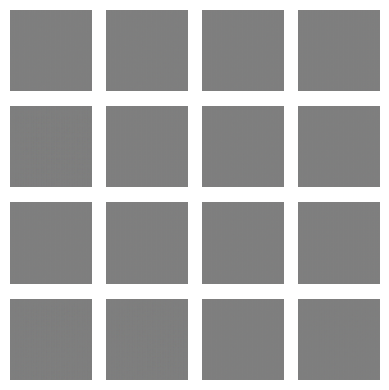

Epoch: 4, Test set ELBO: -8693.26953125, time elapse for current epoch: 5.408333778381348


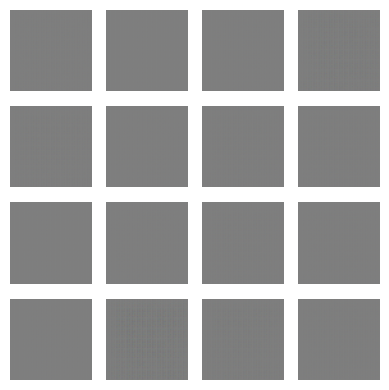

Epoch: 5, Test set ELBO: -8662.7158203125, time elapse for current epoch: 4.405944108963013


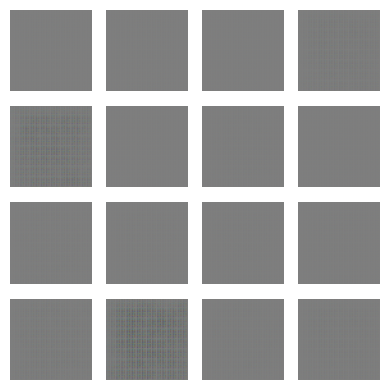

Epoch: 6, Test set ELBO: -8589.2265625, time elapse for current epoch: 3.800722122192383


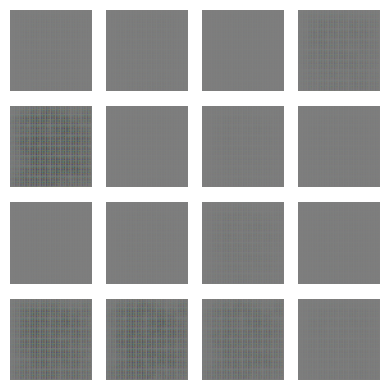

Epoch: 7, Test set ELBO: -8446.8017578125, time elapse for current epoch: 5.217523574829102


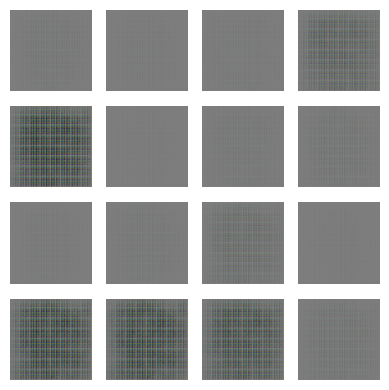

Epoch: 8, Test set ELBO: -8260.7353515625, time elapse for current epoch: 3.7927186489105225


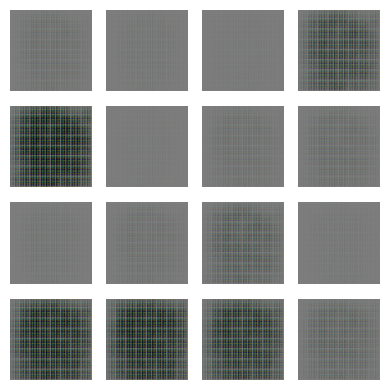

Epoch: 9, Test set ELBO: -8107.42431640625, time elapse for current epoch: 5.162549734115601


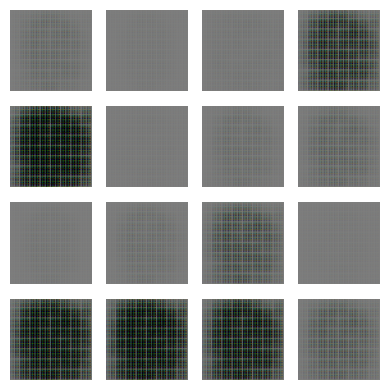

Epoch: 10, Test set ELBO: -7994.458984375, time elapse for current epoch: 3.9374961853027344


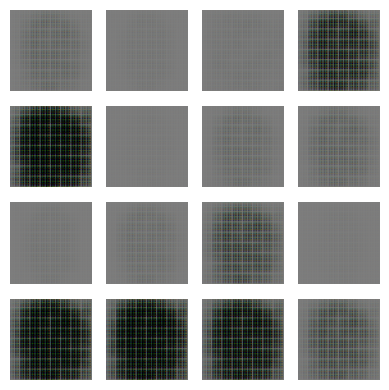

Epoch: 11, Test set ELBO: -7904.0859375, time elapse for current epoch: 4.364160537719727


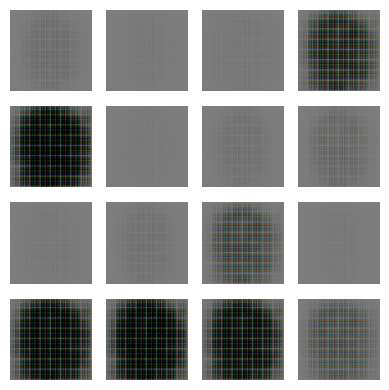

Epoch: 12, Test set ELBO: -7832.31494140625, time elapse for current epoch: 5.3484461307525635


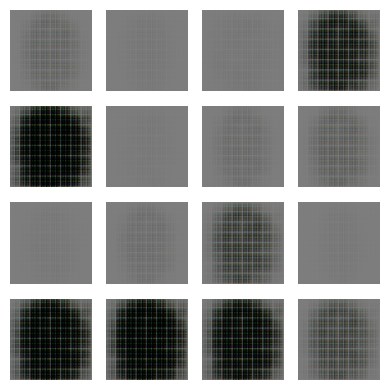

Epoch: 13, Test set ELBO: -7774.38330078125, time elapse for current epoch: 3.8864104747772217


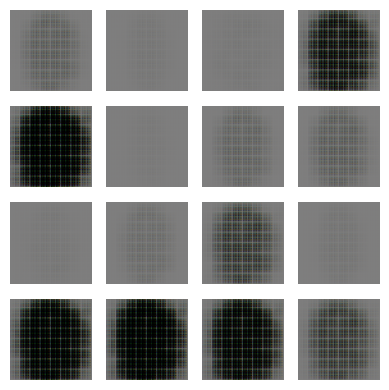

Epoch: 14, Test set ELBO: -7723.94921875, time elapse for current epoch: 4.721060752868652


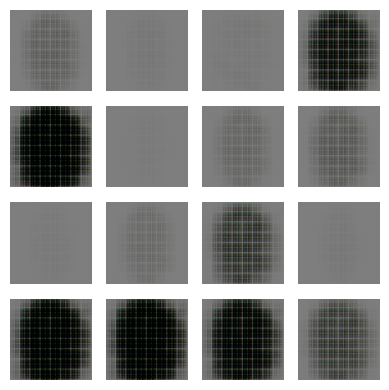

Epoch: 15, Test set ELBO: -7680.35498046875, time elapse for current epoch: 5.568707704544067


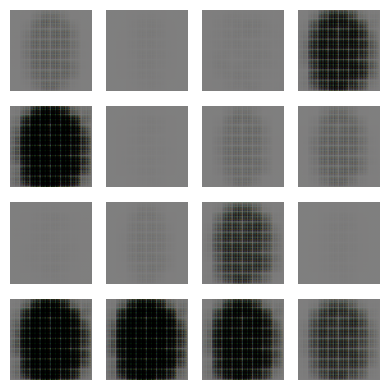

Epoch: 16, Test set ELBO: -7643.166015625, time elapse for current epoch: 3.8450088500976562


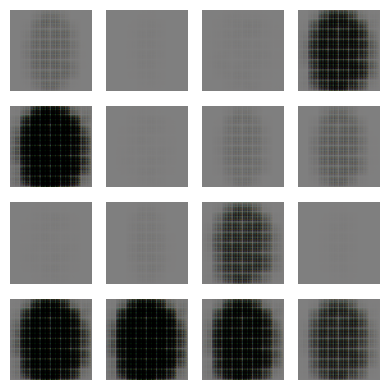

Epoch: 17, Test set ELBO: -7612.05419921875, time elapse for current epoch: 5.850257635116577


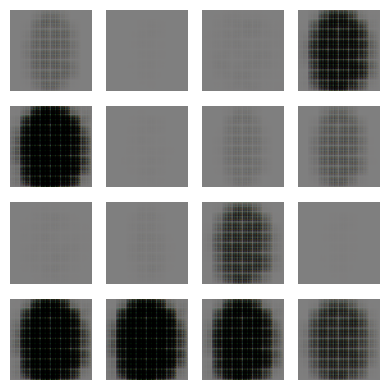

Epoch: 18, Test set ELBO: -7583.96923828125, time elapse for current epoch: 3.8248438835144043


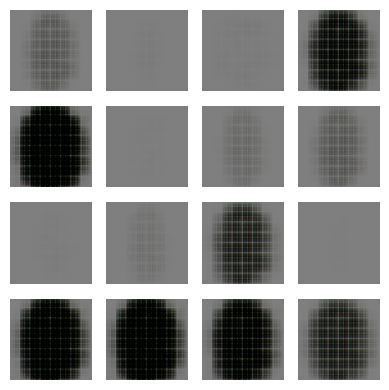

Epoch: 19, Test set ELBO: -7558.27197265625, time elapse for current epoch: 4.125470876693726


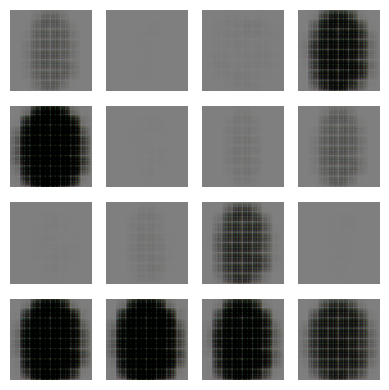

Epoch: 20, Test set ELBO: -7535.025390625, time elapse for current epoch: 4.590262174606323


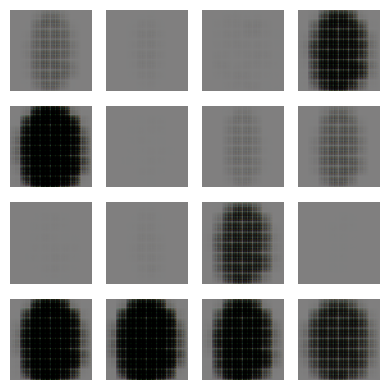

Epoch: 21, Test set ELBO: -7513.62255859375, time elapse for current epoch: 4.225502252578735


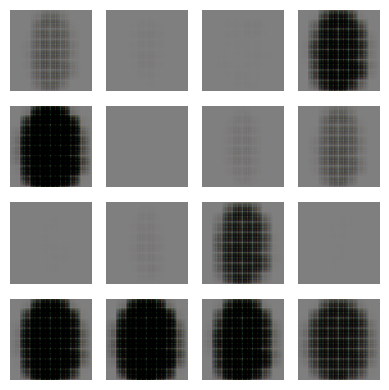

Epoch: 22, Test set ELBO: -7493.046875, time elapse for current epoch: 6.244813919067383


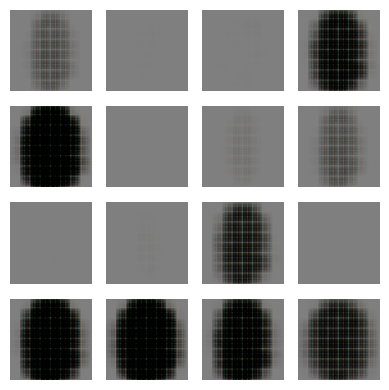

Epoch: 23, Test set ELBO: -7474.52880859375, time elapse for current epoch: 3.803770065307617


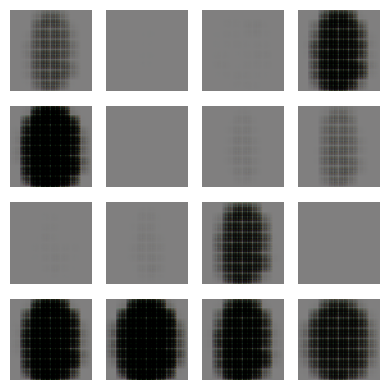

Epoch: 24, Test set ELBO: -7456.63037109375, time elapse for current epoch: 3.885341167449951


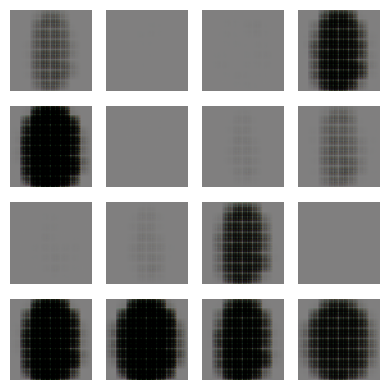

Epoch: 25, Test set ELBO: -7441.71728515625, time elapse for current epoch: 4.862686634063721


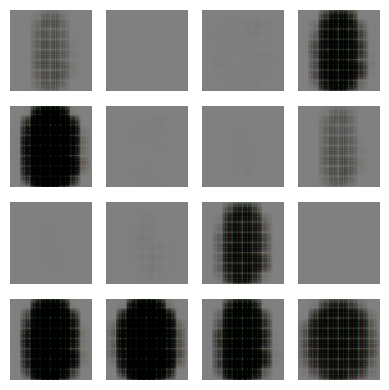

Epoch: 26, Test set ELBO: -7427.58447265625, time elapse for current epoch: 3.8232216835021973


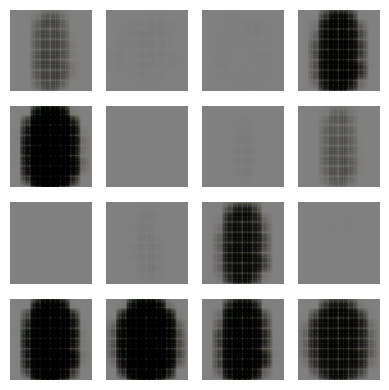

Epoch: 27, Test set ELBO: -7414.67724609375, time elapse for current epoch: 5.48926043510437


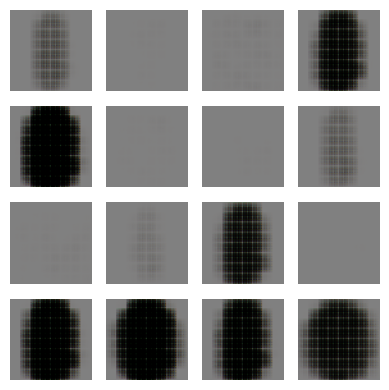

Epoch: 28, Test set ELBO: -7402.4375, time elapse for current epoch: 3.760904550552368


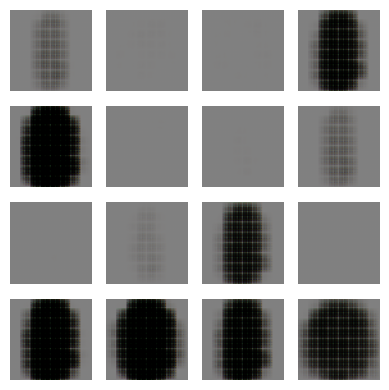

Epoch: 29, Test set ELBO: -7391.10205078125, time elapse for current epoch: 3.7997474670410156


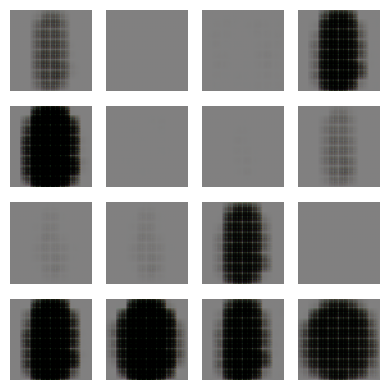

Epoch: 30, Test set ELBO: -7380.841796875, time elapse for current epoch: 5.83595609664917


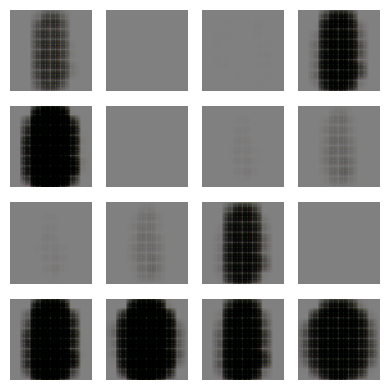

Epoch: 31, Test set ELBO: -7372.17626953125, time elapse for current epoch: 3.8275513648986816


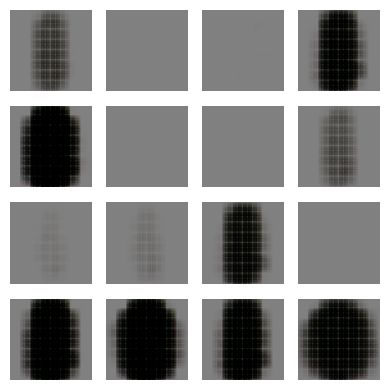

Epoch: 32, Test set ELBO: -7363.28515625, time elapse for current epoch: 4.260290861129761


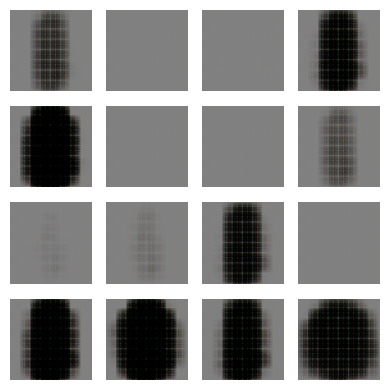

Epoch: 33, Test set ELBO: -7355.45068359375, time elapse for current epoch: 4.914621114730835


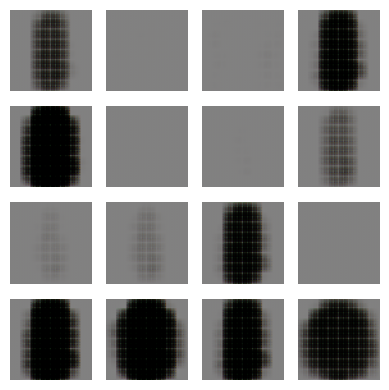

Epoch: 34, Test set ELBO: -7346.92822265625, time elapse for current epoch: 3.793029308319092


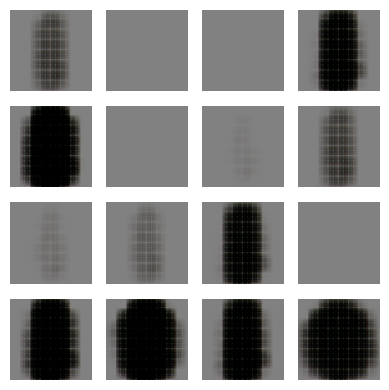

Epoch: 35, Test set ELBO: -7340.02880859375, time elapse for current epoch: 5.507622718811035


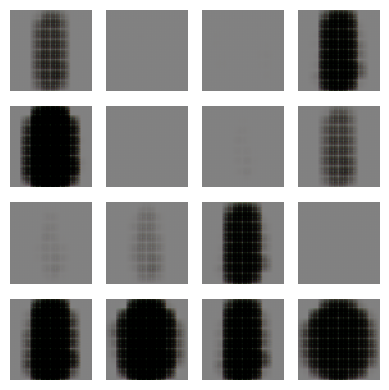

Epoch: 36, Test set ELBO: -7332.26708984375, time elapse for current epoch: 3.8897740840911865


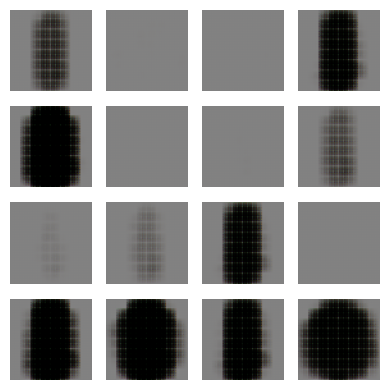

Epoch: 37, Test set ELBO: -7324.955078125, time elapse for current epoch: 3.856818199157715


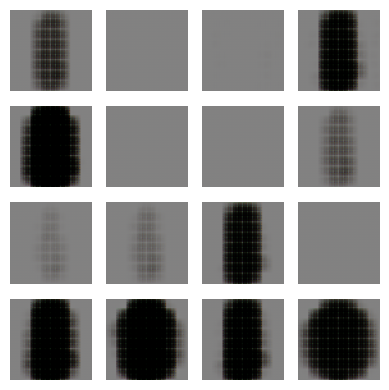

Epoch: 38, Test set ELBO: -7318.236328125, time elapse for current epoch: 5.605180025100708


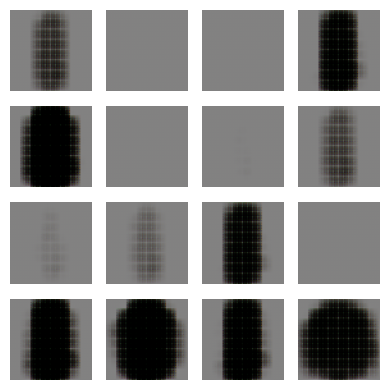

Epoch: 39, Test set ELBO: -7312.466796875, time elapse for current epoch: 3.828617572784424


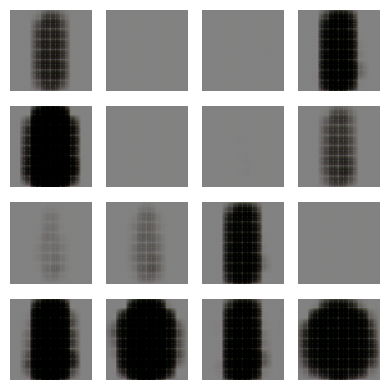

Epoch: 40, Test set ELBO: -7306.73974609375, time elapse for current epoch: 4.915301561355591


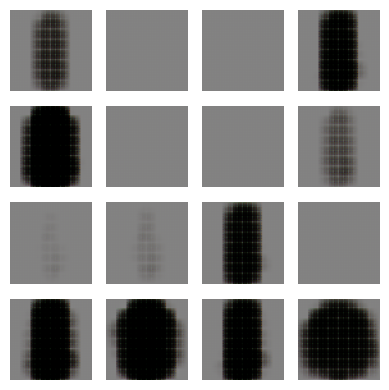

Epoch: 41, Test set ELBO: -7300.80810546875, time elapse for current epoch: 4.28462815284729


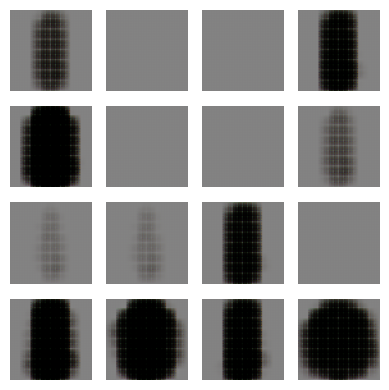

Epoch: 42, Test set ELBO: -7295.76953125, time elapse for current epoch: 3.841134786605835


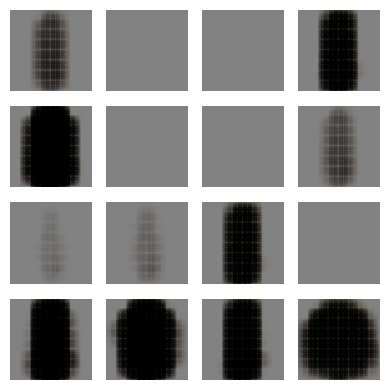

Epoch: 43, Test set ELBO: -7289.767578125, time elapse for current epoch: 5.964599847793579


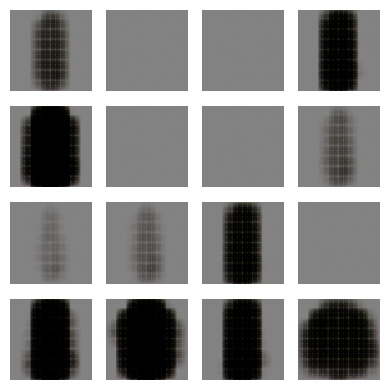

Epoch: 44, Test set ELBO: -7286.38720703125, time elapse for current epoch: 3.8551719188690186


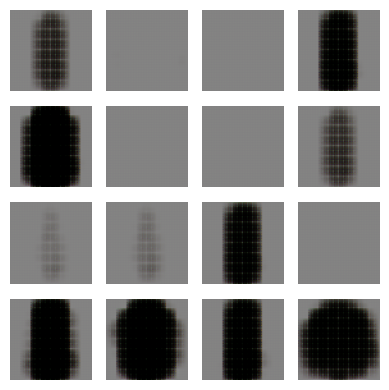

Epoch: 45, Test set ELBO: -7278.97900390625, time elapse for current epoch: 3.836772918701172


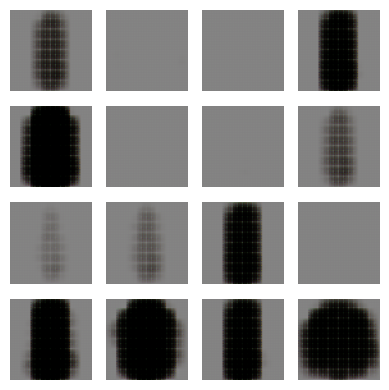

Epoch: 46, Test set ELBO: -7276.11572265625, time elapse for current epoch: 6.766175031661987


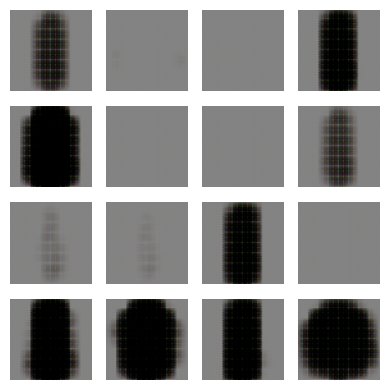

Epoch: 47, Test set ELBO: -7270.56005859375, time elapse for current epoch: 3.8857522010803223


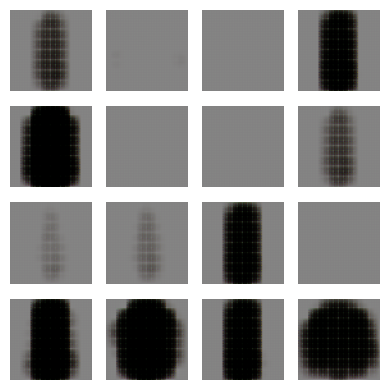

Epoch: 48, Test set ELBO: -7265.23193359375, time elapse for current epoch: 5.963494300842285


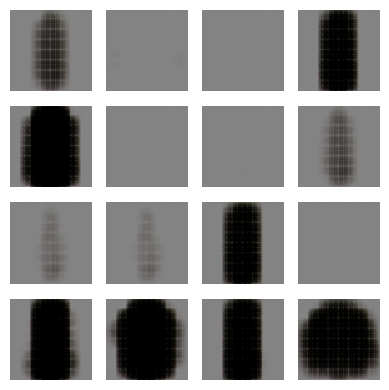

Epoch: 49, Test set ELBO: -7261.43603515625, time elapse for current epoch: 3.85614013671875


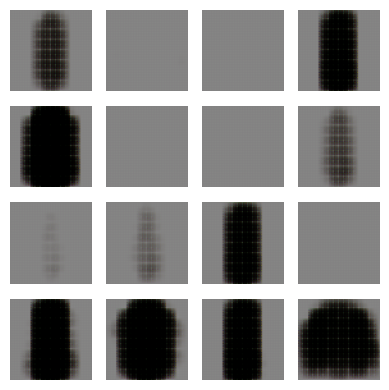

Epoch: 50, Test set ELBO: -7256.693359375, time elapse for current epoch: 3.9806315898895264


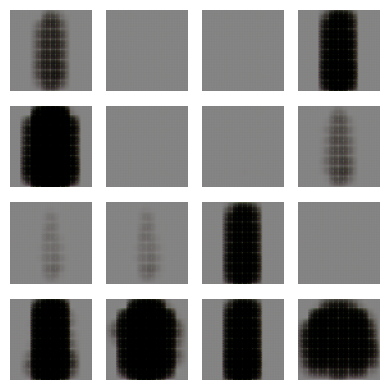

Epoch: 51, Test set ELBO: -7252.35888671875, time elapse for current epoch: 5.161451578140259


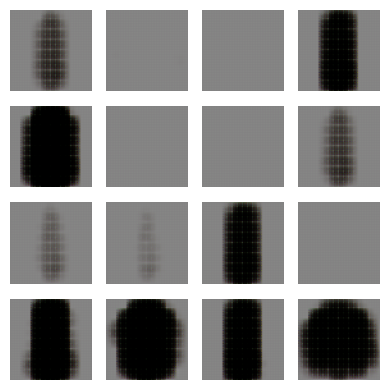

Epoch: 52, Test set ELBO: -7247.744140625, time elapse for current epoch: 3.844280242919922


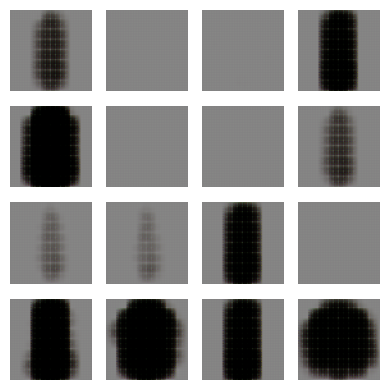

Epoch: 53, Test set ELBO: -7243.99365234375, time elapse for current epoch: 5.364782810211182


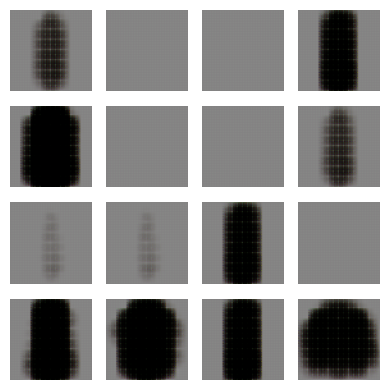

Epoch: 54, Test set ELBO: -7238.52490234375, time elapse for current epoch: 3.8126368522644043


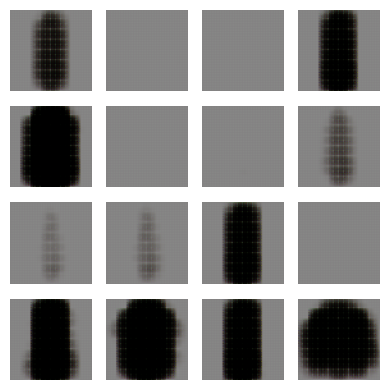

Epoch: 55, Test set ELBO: -7234.564453125, time elapse for current epoch: 3.8892123699188232


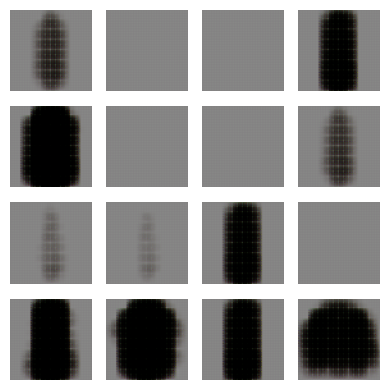

Epoch: 56, Test set ELBO: -7231.28271484375, time elapse for current epoch: 5.772188663482666


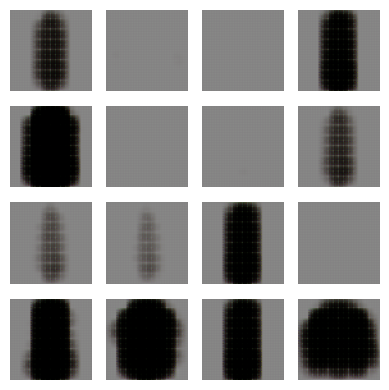

Epoch: 57, Test set ELBO: -7225.90234375, time elapse for current epoch: 3.8913936614990234


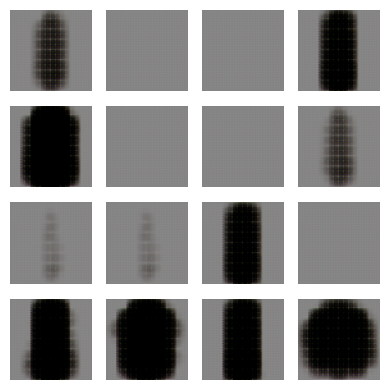

Epoch: 58, Test set ELBO: -7222.28173828125, time elapse for current epoch: 4.315803050994873


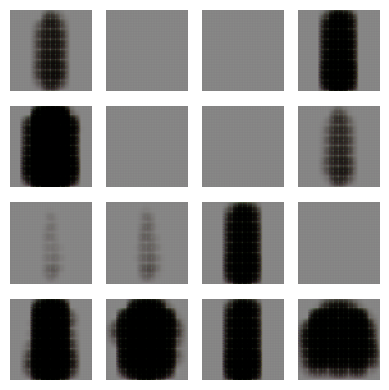

Epoch: 59, Test set ELBO: -7217.80322265625, time elapse for current epoch: 4.490776300430298


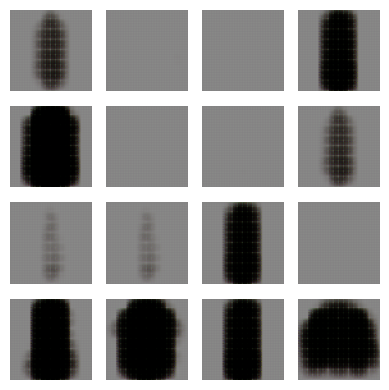

Epoch: 60, Test set ELBO: -7213.75537109375, time elapse for current epoch: 3.8482460975646973


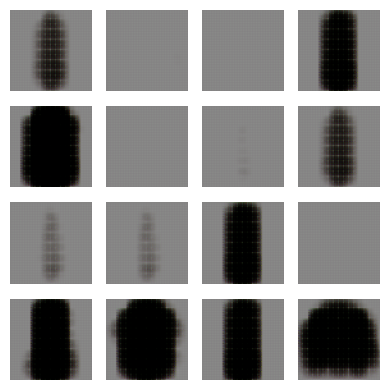

Epoch: 61, Test set ELBO: -7209.21630859375, time elapse for current epoch: 5.515693187713623


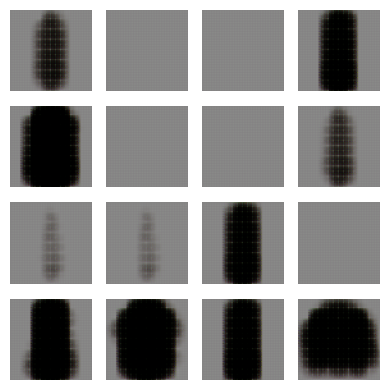

Epoch: 62, Test set ELBO: -7205.44140625, time elapse for current epoch: 3.969532012939453


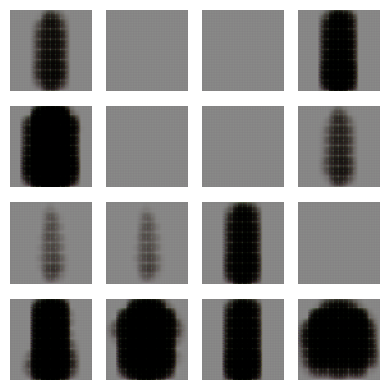

Epoch: 63, Test set ELBO: -7201.755859375, time elapse for current epoch: 3.900212526321411


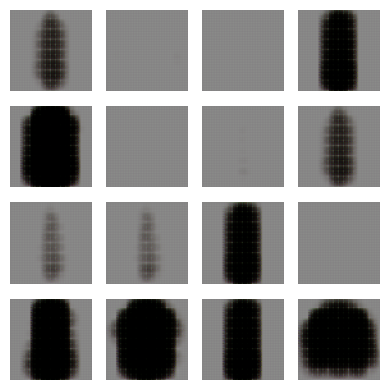

Epoch: 64, Test set ELBO: -7196.921875, time elapse for current epoch: 5.5493323802948


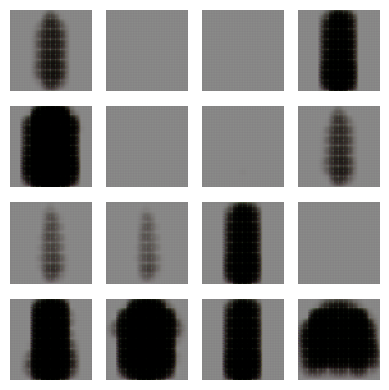

Epoch: 65, Test set ELBO: -7192.72314453125, time elapse for current epoch: 3.849750518798828


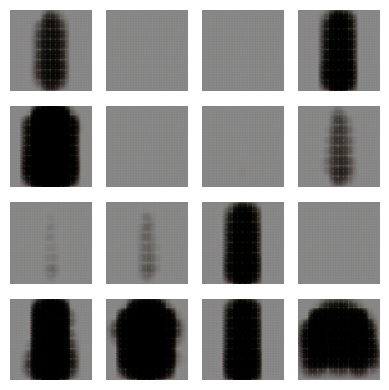

Epoch: 66, Test set ELBO: -7188.02587890625, time elapse for current epoch: 4.743718862533569


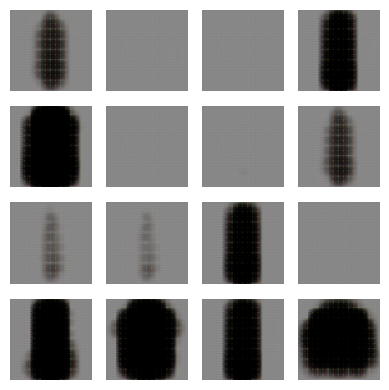

Epoch: 67, Test set ELBO: -7185.8203125, time elapse for current epoch: 4.059847116470337


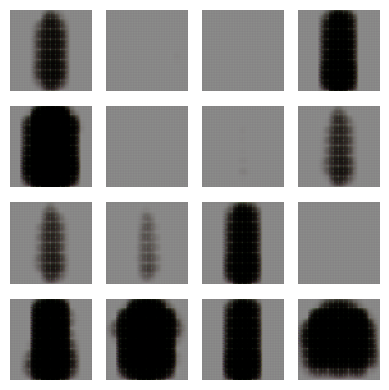

Epoch: 68, Test set ELBO: -7179.55859375, time elapse for current epoch: 3.8823082447052


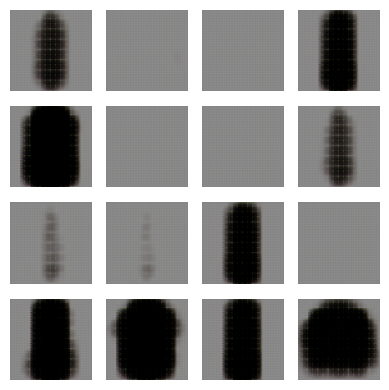

Epoch: 69, Test set ELBO: -7176.845703125, time elapse for current epoch: 5.972890377044678


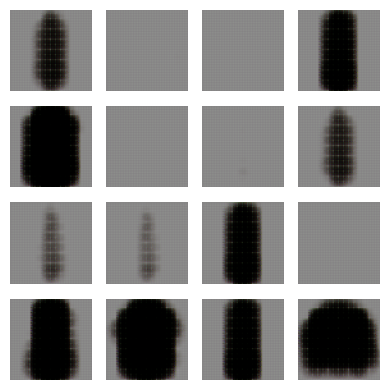

Epoch: 70, Test set ELBO: -7170.49658203125, time elapse for current epoch: 3.834974765777588


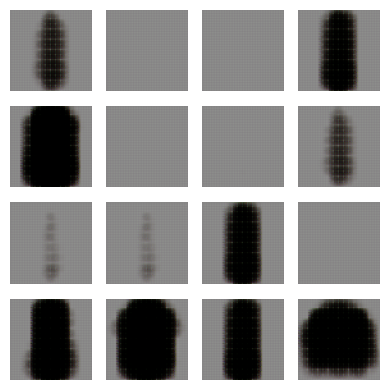

Epoch: 71, Test set ELBO: -7166.83544921875, time elapse for current epoch: 3.9562785625457764


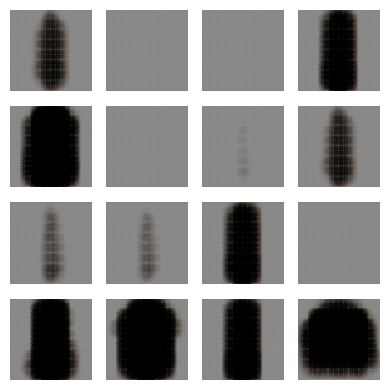

Epoch: 72, Test set ELBO: -7162.28955078125, time elapse for current epoch: 4.900770425796509


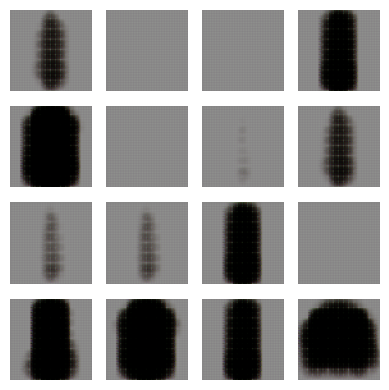

Epoch: 73, Test set ELBO: -7158.0234375, time elapse for current epoch: 3.8699734210968018


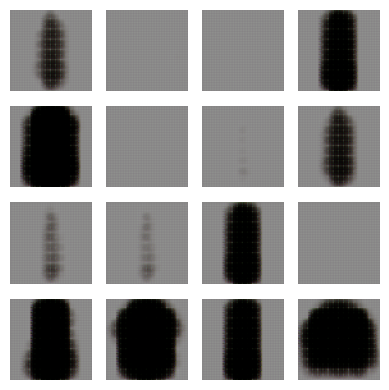

Epoch: 74, Test set ELBO: -7152.71484375, time elapse for current epoch: 5.141571283340454


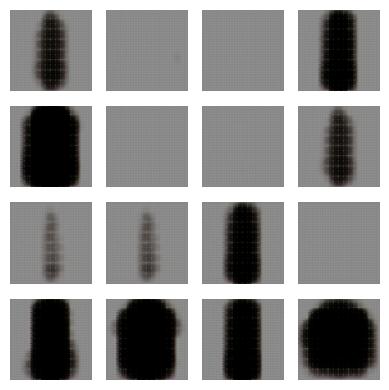

Epoch: 75, Test set ELBO: -7147.498046875, time elapse for current epoch: 4.017423391342163


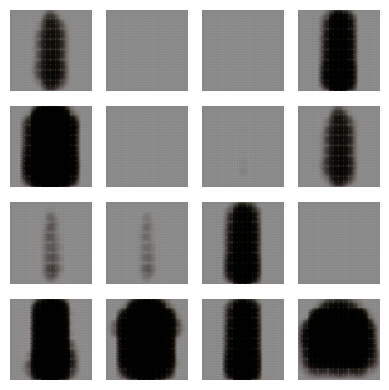

Epoch: 76, Test set ELBO: -7143.56103515625, time elapse for current epoch: 3.819096565246582


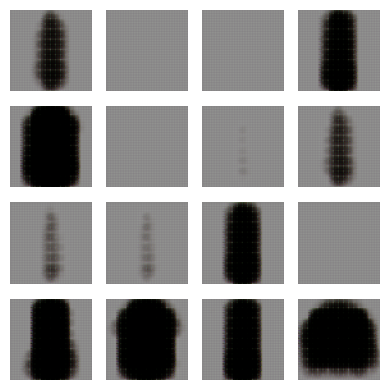

Epoch: 77, Test set ELBO: -7138.34375, time elapse for current epoch: 5.992992639541626


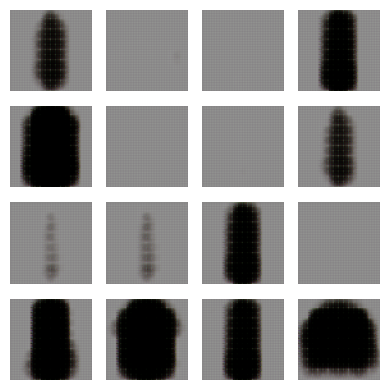

Epoch: 78, Test set ELBO: -7133.59619140625, time elapse for current epoch: 5.977765798568726


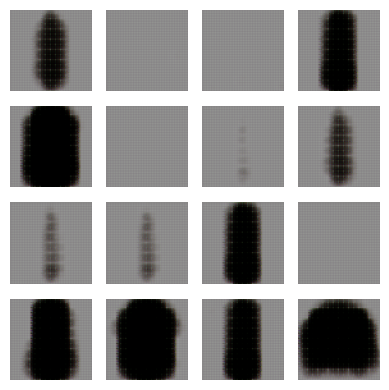

Epoch: 79, Test set ELBO: -7129.47900390625, time elapse for current epoch: 5.486421346664429


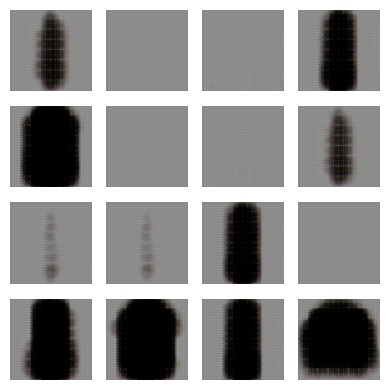

Epoch: 80, Test set ELBO: -7123.52734375, time elapse for current epoch: 3.884270191192627


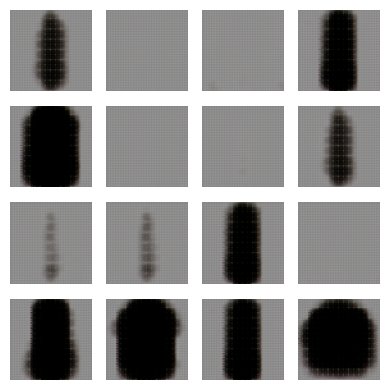

Epoch: 81, Test set ELBO: -7117.97998046875, time elapse for current epoch: 3.8542392253875732


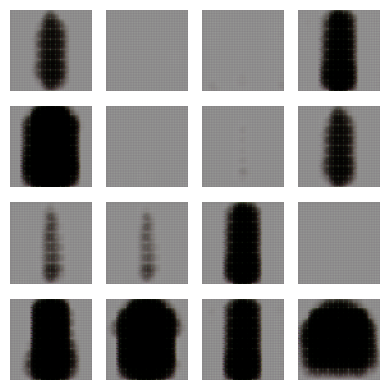

Epoch: 82, Test set ELBO: -7113.41552734375, time elapse for current epoch: 5.813695907592773


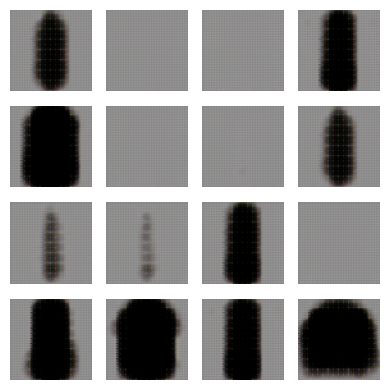

Epoch: 83, Test set ELBO: -7105.35498046875, time elapse for current epoch: 3.935805082321167


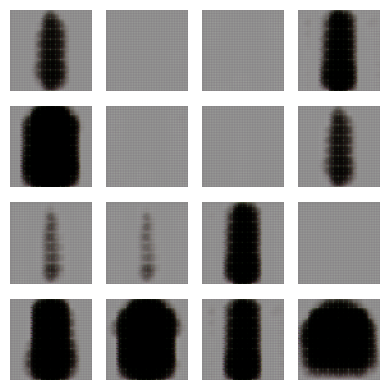

Epoch: 84, Test set ELBO: -7098.564453125, time elapse for current epoch: 5.144197702407837


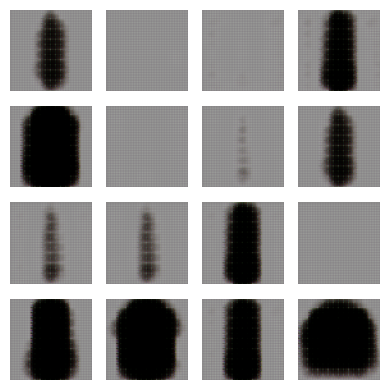

Epoch: 85, Test set ELBO: -7088.95166015625, time elapse for current epoch: 3.9899673461914062


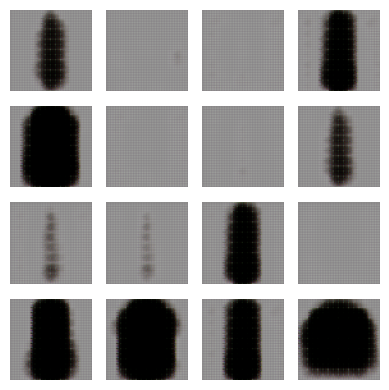

Epoch: 86, Test set ELBO: -7083.05224609375, time elapse for current epoch: 3.857769012451172


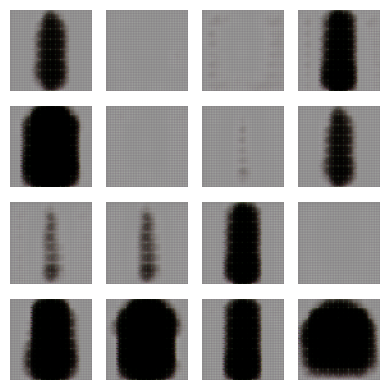

Epoch: 87, Test set ELBO: -7070.36865234375, time elapse for current epoch: 5.929043769836426


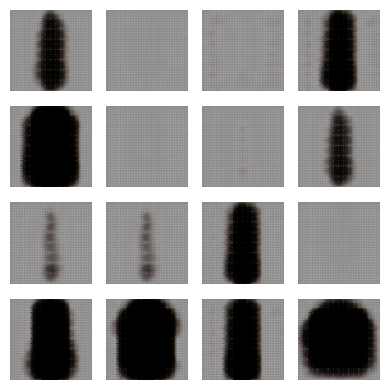

Epoch: 88, Test set ELBO: -7058.3046875, time elapse for current epoch: 3.9217569828033447


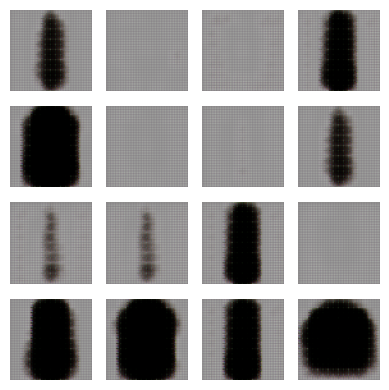

Epoch: 89, Test set ELBO: -7045.65625, time elapse for current epoch: 6.246751308441162


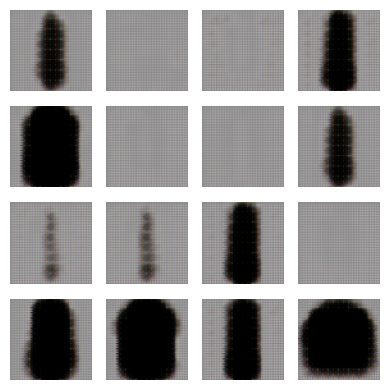

Epoch: 90, Test set ELBO: -7031.00537109375, time elapse for current epoch: 4.776954889297485


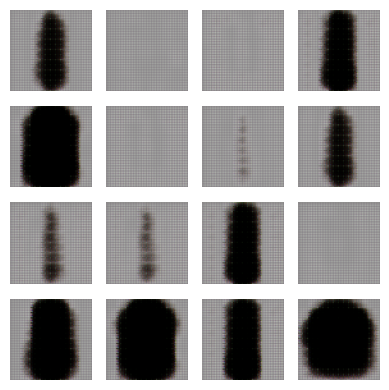

Epoch: 91, Test set ELBO: -7012.830078125, time elapse for current epoch: 3.8767127990722656


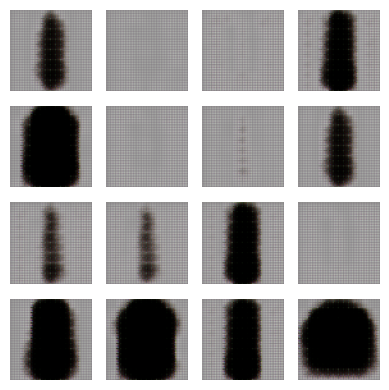

Epoch: 92, Test set ELBO: -6995.869140625, time elapse for current epoch: 5.9130799770355225


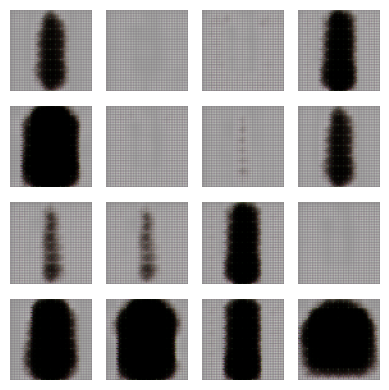

Epoch: 93, Test set ELBO: -6975.09228515625, time elapse for current epoch: 3.881434440612793


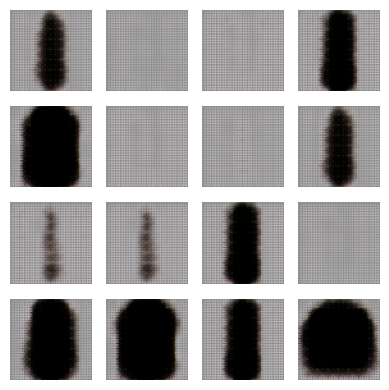

Epoch: 94, Test set ELBO: -6946.90771484375, time elapse for current epoch: 3.939404010772705


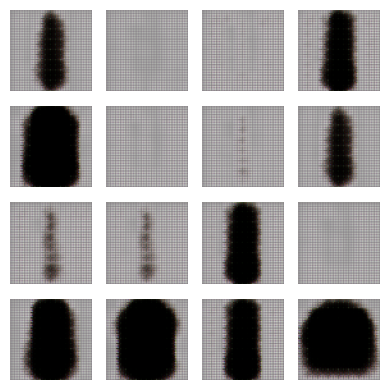

Epoch: 95, Test set ELBO: -6920.86669921875, time elapse for current epoch: 5.249544382095337


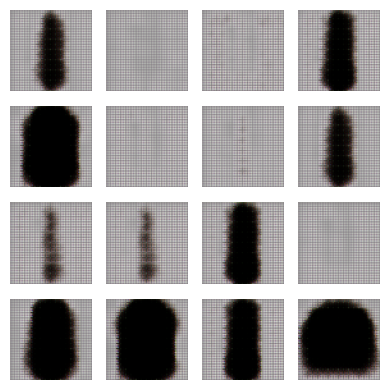

Epoch: 96, Test set ELBO: -6896.03125, time elapse for current epoch: 3.8551137447357178


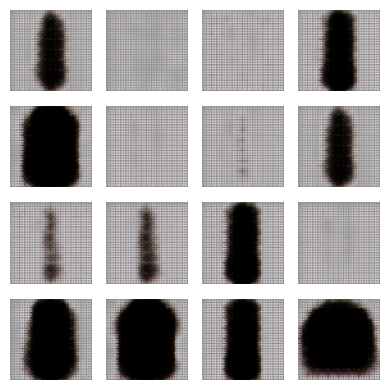

Epoch: 97, Test set ELBO: -6859.16845703125, time elapse for current epoch: 5.321985483169556


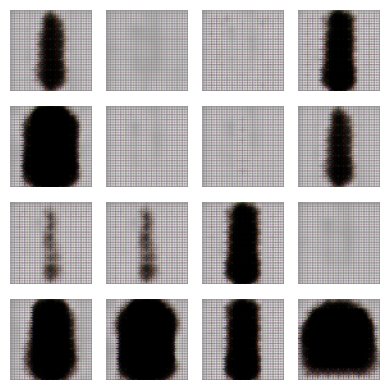

Epoch: 98, Test set ELBO: -6826.75244140625, time elapse for current epoch: 3.9549624919891357


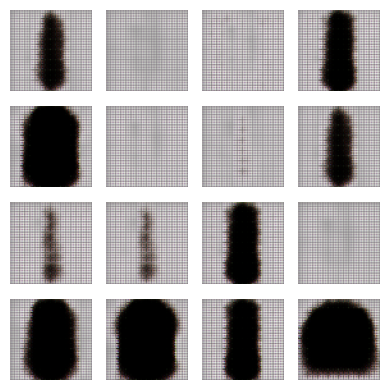

Epoch: 99, Test set ELBO: -6794.134765625, time elapse for current epoch: 3.9158730506896973


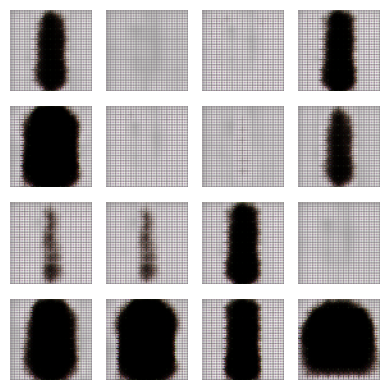

Epoch: 100, Test set ELBO: -6759.73388671875, time elapse for current epoch: 5.862897634506226


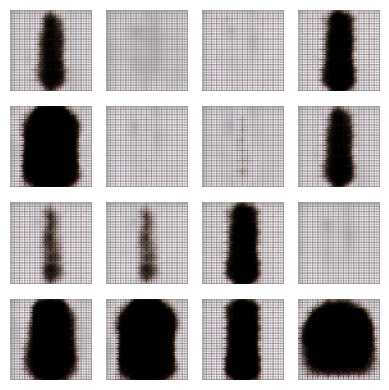

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in val_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  # display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

### Display a generated image from the last training epoch

In [ ]:
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

(np.float64(-0.5), np.float64(399.5), np.float64(399.5), np.float64(-0.5))

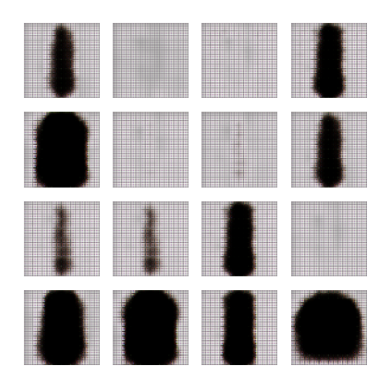

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

### Display an animated GIF of all the saved images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

/tmp/ipython-input-12-1290275450.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/tmp/ipython-input-12-1290275450.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/tmp/ipython-input-12-1290275450.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



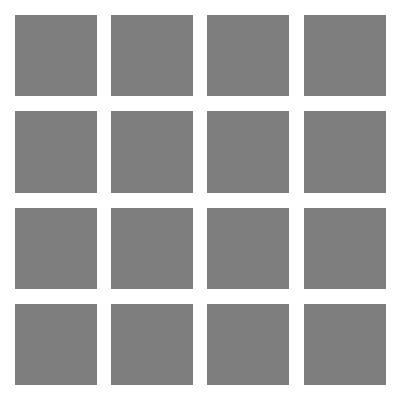

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

### Save images

In [ ]:
import os
import shutil

current_dir = os.getcwd()
png_files = [f for f in os.listdir(current_dir) if f.endswith('.png')]
destination_folder = '/content/drive/MyDrive/Colab Notebooks/tfg/vae/generated_images_vae_model_1'
os.makedirs(destination_folder, exist_ok=True)

for file_name in png_files:
    full_file_name = os.path.join(current_dir, file_name)
    shutil.copy(full_file_name, destination_folder)

print(f"Se copiaron {len(png_files)} archivos .png a {destination_folder}")

Se copiaron 101 archivos .png a /content/drive/MyDrive/Colab Notebooks/tfg/vae/generated_images_vae_model_1


### Show results throughout the epochs

In [2]:
dir = '/content/drive/MyDrive/Colab Notebooks/tfg/vae/generated_images_vae_model_1'

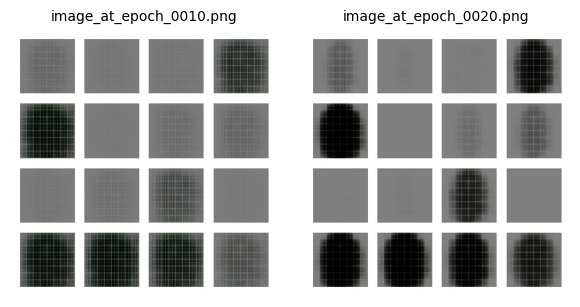

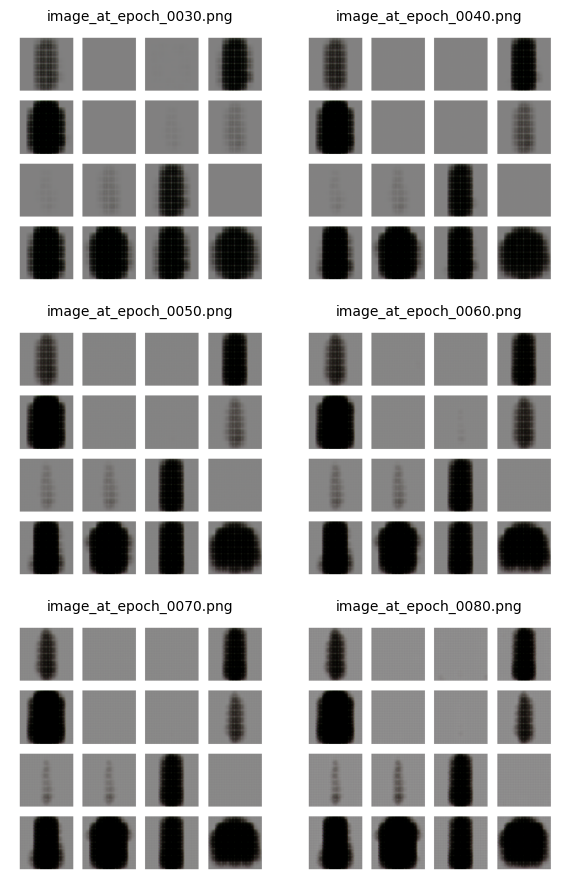

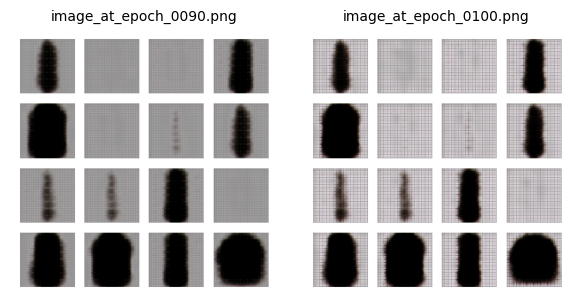

In [7]:
import os
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Extraer número desde el nombre del archivo
def extract_number(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group()) if match else -1

# Mostrar imágenes en una cuadrícula configurable
def show_images_grid(images, num_rows, num_cols, title=""):
    plt.figure(figsize=(num_cols * 3, num_rows * 3))
    for i, file_name in enumerate(images):
        img = mpimg.imread(file_name)
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(os.path.basename(file_name), fontsize=10)
    # plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# Directorio de imágenes
modulo = 10  # Cambia esto si solo quieres cada n imagen

# Filtrar y ordenar
png_files = [f for f in os.listdir(dir) if f.endswith('.png')]
png_files = [f for f in png_files if extract_number(f) % modulo == 0]
png_files = sorted(png_files, key=extract_number)

# Cargar rutas completas
png_paths = [os.path.join(dir, f) for f in png_files]

# Mostrar primeras 6 (en cuadrícula 2x3)
show_images_grid(png_paths[1:3], 2, 2)

# Mostrar siguientes 4 (en cuadrícula 2x2)
show_images_grid(png_paths[3:9], 3, 2)

show_images_grid(png_paths[9:11], 2, 2)

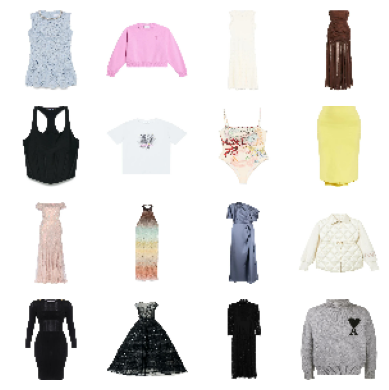

In [ ]:
import matplotlib.pyplot as plt

def display_test_sample(test_sample):
  fig = plt.figure(figsize=(4, 4))
  for i in range(test_sample.shape[0]):
    plt.subplot(4, 4, i + 1)
    # Assuming the images are in the range [-1, 1] due to preprocessing
    # We need to scale them back to [0, 1] for display
    image = (test_sample[i] + 1) / 2
    plt.imshow(image)
    plt.axis('off')
  plt.tight_layout()
  plt.show()

display_test_sample(test_sample)